## Notes On Equilibria In The Three Equation NK Model

In [2]:
using Gadfly,Cairo,Fontconfig
set_default_plot_size(40cm,20cm)
Gadfly.push_theme(Theme(major_label_font_size=20pt,minor_label_font_size=14pt,key_label_font_size=16pt,
                        line_width=2pt,point_size=3pt))

I'm going to quickly go over equilibria in our three equation NK model.  Recall that in class we derived
the New Keynesian Phillips and IS curves which were given by 
$$
\pi_t = \beta\mathbb E_t[\pi_{t+1}] + \kappa \tilde y_t
$$
and
$$
\tilde y_t = -\frac1{\sigma}(i_t-\mathbb E_t \pi_{t+1} - r^n_t) +\mathbb E_t\tilde y_{t+1}.
$$
In addition, we impose a rule for the monetary authority that takes the following form 
$$
i_t = \rho + \phi_\pi \pi_t + \phi_y\tilde y_t + \nu_t
$$
where $\nu_t$ is a policy shock which follows an AR(1) process
$$
\nu_t = \rho_\nu \nu_{t-1} + \epsilon^\nu_t
$$


Combining these three equations we write the economy as linear difference equation that takes the following form
$$
\left(\begin{matrix}\pi_t\\ \tilde y_t\end{matrix}\right)=A\mathbb E_t\left(\begin{matrix}\pi_{t+1}\\ \tilde y_{t+1}\end{matrix}\right) + B(\hat r^n_t -\nu_t)
$$
where $\hat r^n_t = r^n_t -\rho$ and
$$
    A = \frac{1}{\sigma +\phi_y+\kappa\phi_\pi}\left(\begin{matrix}\sigma & 1-\beta\phi_\pi\\ \sigma\kappa&\kappa+\beta(\sigma +\phi_y)\end{matrix}\right)\text{  and  }B =\frac{1}{\sigma +\phi_y+\kappa\phi_\pi}\left(\begin{matrix}1\\ \kappa\end{matrix}\right)
$$

## Unique Stationary Equilibria
Let $x_t = \left(\begin{matrix}\pi_t\\ \tilde y_t\end{matrix}\right)$ then our difference equation can be written as 
$$
x_t =A\mathbb E_tx_{t+1} + B(\hat r^n_t -\nu_t)
$$
Our objective will be to find solutions to this linear difference equation which are stationary:
$$
\lim_{T\rightarrow\infty}\mathbb E_t x_{t+T} = 0.
$$
Our first result is that if all the eigenvalues of $A$ are less than 1 then there is a unique 
stationary equilibria.  To see this observe that we can substitute for $x_{t+1}$ to get
$$
x_t =A\mathbb E_t\left[Ax_{t+2} + B(\hat r^n_{t+1} -\nu_{t+t})\right] + B(\hat r^n_t -\nu_t).
$$
Repeating this exercise we get 
$$
x_t = \sum_{k=0}^K A^k B\mathbb E_t(\hat r^n_{t+k} -\nu_{t+k}) + A^K\mathbb E_tx_{t+K+1}.  
$$
That the eigenvalues of $A$ are all less than $1$ implies that there exists a matrix norm such that $\|A\|<1$.
Thus 
$$
\lim_{K\rightarrow\infty}\|A^K\mathbb E_tx_{t+K+1}\|\leq \lim_{K\rightarrow\infty}\|\mathbb E_tx_{t+K+1}\|=0
$$
so 
$$
x_t = \sum_{k=0}^\infty A^k B\mathbb E_t(\hat r^n_{t+k} -\nu_{t+k}).  
$$
Next we note that $\mathbb E_t\nu_{t+k}=\rho_\nu^k\nu_t$.  Similarly, if we assume that 
$$
    a_t = \rho_a a_{t-1} + \varepsilon^a_t
$$
then 
$$
    \hat r^n_t =-\sigma \psi^n_{ya}(1-\rho_a)a_t
$$
and hence 
$$
\mathbb E_t\hat r^n_{t+k}=\rho_a^k \hat r^n_t.
$$
Recall the $\psi^n_{ya}$ is the loading of the natural rate of output on tfp: $y^n_t =\psi^n_{ya}a_t + \nu^n_y$.
Combined we have that 
$$
x_t = \sum_{k=0}^\infty A^k B\mathbb (\rho_a^k\hat r^n_{t} -\rho_\nu^k\nu_{t})=-\sigma \psi^n_{ya}(1-\rho_a)(I-\rho_a A)^{-1}B a_t - (I-\rho_\nu A)^{-1}B\nu_t \equiv x_a a_t + x_\nu \nu_t
$$
which is our expression for equilibrium outcomes as a function of shocks.  

To get a better feel for this equilibrium let's work with a calibrated model.  We'll study a 
quaterly calibration from Gali

In [3]:
using Parameters
@with_kw mutable struct NKParameters
    β=0.99 #quaterly discount factor
    σ=1 #Intertemporal Elasticity of Substitution =1
    φ=1 #Frisch Elasticity
    ε=6 #Targets a desired markup of 20%
    θ=2/3 #Average price duration of three quarters
    ρ_ν=0.5 #persistence of interest rate shock
    ρ_a = 0.9 #persistence of tfp shock
    σ_ν = 0.0025 #25 basis point monetary policy shocks
    σ_a = 0.01 #1% tfp shock
    ϕ_y = 0.# 0.5/4 in Gali but we'll set to zero for simplicity
    ϕ_π = 1.5

    #additional terms from Gali
    λ = (1-θ)*(1-β*θ)/θ
    ψn_ya = (1+φ)/(σ+φ)
    κ = λ*(σ+φ)
end;

Next we'll write code to solve for the stationary equilibrium given parameters.  We'll call this
solution the minimum state variable equilibrium (MSV) because in the case of multiple equilibria (see below)
this equilibria has the smallest number of state variables (just the exogeneous shocks)

In [4]:
using LinearAlgebra
"""
    solve_eqb_msv(para)

Solves for the equilibrium policy rules given parameters.  
Finds the minimum state variable solution.
"""
function solve_eqb_msv(para)
    @unpack σ,ϕ_y,ϕ_π,β,κ,ψn_ya,ρ_a,ρ_ν = para
    Ω = 1/(σ+ϕ_y+κ*ϕ_π) 
    A = Ω.*[σ   1-β*ϕ_π;
            σ*κ κ+β*(σ+ϕ_y)]
    B = Ω.*[1;κ]

    #Note I is the identity matrix in julia
    x_a = -σ*ψn_ya*(1-ρ_a)*inv(I-ρ_a*A)*B #equilibrium loading tfp
    x_ν = -inv(I-ρ_ν*A)*B     #equilibrium loading on ν

    return x_a,x_ν,A,B
end;

We can now write some code to simulate impulse repsones.  We'll feed in some initial values of $a$ and $\nu$ and compute 
the path of all endogenous outcomes assuming all future shocks are 0 for T periods.  We store all variables 
as deviations from their steady state levels

In [5]:
using DataFrames
"""
    compute_irf_msv(para,a0,ν0,T)

Computes and impulse response for the minimum state variable solution
"""
function compute_irf_msv(para,a0,ν0,T)
    @unpack ρ_a,ρ_ν,σ,β,ϕ_y,ϕ_π,ψn_ya = para
    ρ = -log(β)
    x_a,x_ν,A,B = solve_eqb_msv(para)
    a = [a0*ρ_a^(t-1) for t in 1:T+1]
    ν = [ν0*ρ_ν^(t-1) for t in 1:T+1]

    #construct a DataFrame to store results
    df = DataFrame(zeros(T,7),[:i,:r,:r_n,:ỹ,:a,:π,:y_n])
    df.a = a[1:T]
    df.ν = ν[1:T]
    for t in 1:T
        df.ỹ[t],df.π[t] = x_a*a[t] + x_ν*ν[t]
        df.i[t] = ϕ_y*df.ỹ[t] + ϕ_π*df.π[t] + ν[t]
        Eπ′ = (x_a*a[t+1] + x_ν*ν[t+1])[2] #expected inflation given equlibrium
        df.r[t] = df.i[t] - Eπ′
        df.r_n[t] = - σ*ψn_ya*(1-ρ_a)*a[t]
        df.y_n[t] = ψn_ya*a[t]#deviation of natural rate of output from steady state
    end
    df.t = 1:T
    df.y = df.y_n .+ df.ỹ
    return df
end;

### Monetary policy shock
We'll start with monetary policy shock which raises interest rates by 25 basis point_size

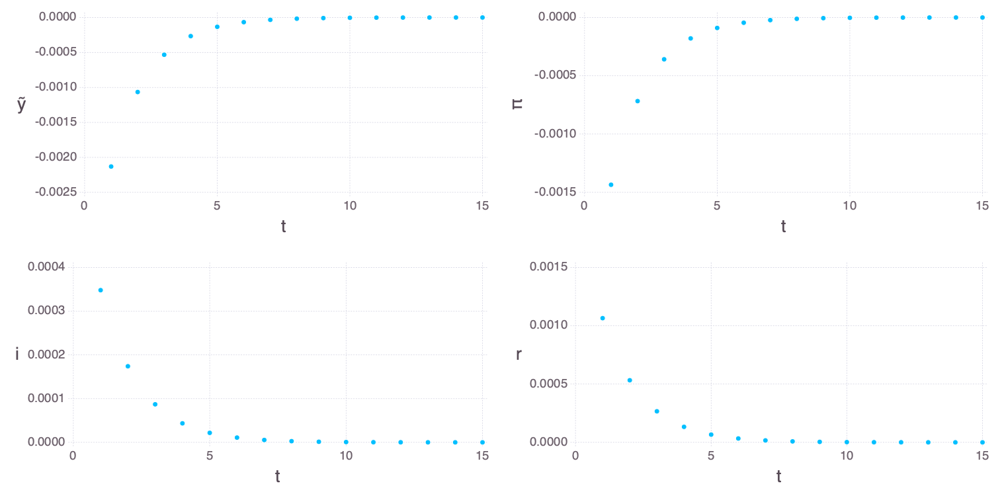

In [6]:
using Gadfly#Plotting Library
para = NKParameters()
df_irf_a = compute_irf_msv(para,0.,para.σ_ν,15)
gridstack([plot(df_irf_a,x=:t,y=:ỹ) plot(df_irf_a,x=:t,y=:π);
           plot(df_irf_a,x=:t,y=:i) plot(df_irf_a,x=:t,y=:r);])

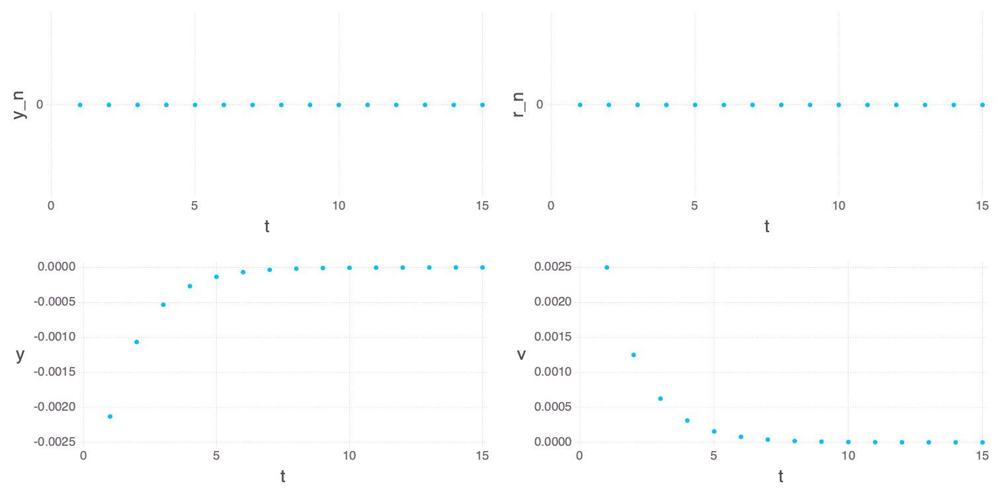

In [7]:
gridstack([plot(df_irf_a,x=:t,y=:y_n) plot(df_irf_a,x=:t,y=:r_n);
           plot(df_irf_a,x=:t,y=:y) plot(df_irf_a,x=:t,y=:ν)])

The monetary policy shock does not affect the natural level output or the natural interest rate
since with flexible prices monetary policy is neutral.  Instead the monetary policy shock generates a persistent
increase in the nominal rate which in turn raises the real rate which depresses output and 
generates deflation.  It's important to note that because the equilibrium nominal rate is determined by the 
Taylor rule which depends on inflation the resulting nominal interest raises less than 25 basis points.  
In fact, if we set the persistence of the monetary policy shock to be large enough a positive monetary policy shock can 
actually lead to a decrease in the realized nominal rate:

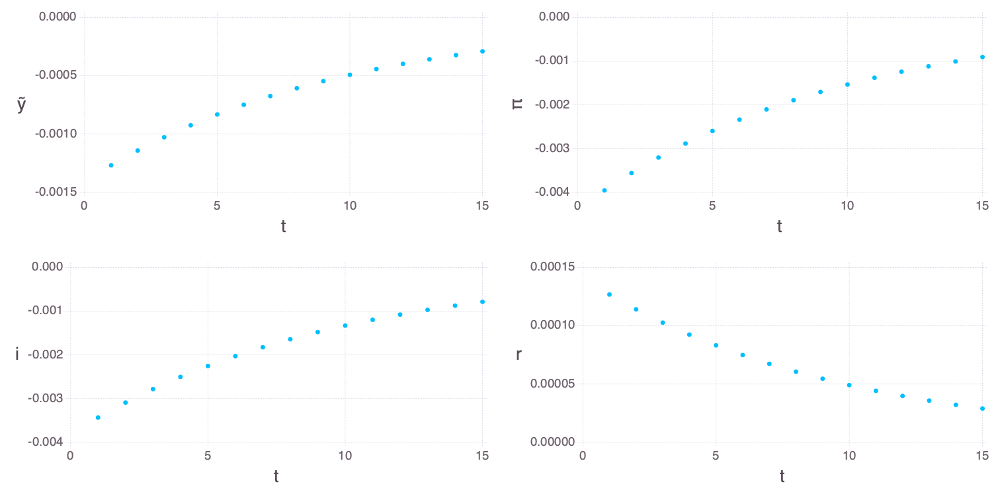

In [8]:
para.ρ_ν = 0.9
df_irf_a = compute_irf_msv(para,0.,para.σ_ν,15)
gridstack([plot(df_irf_a,x=:t,y=:ỹ) plot(df_irf_a,x=:t,y=:π);
           plot(df_irf_a,x=:t,y=:i) plot(df_irf_a,x=:t,y=:r);])

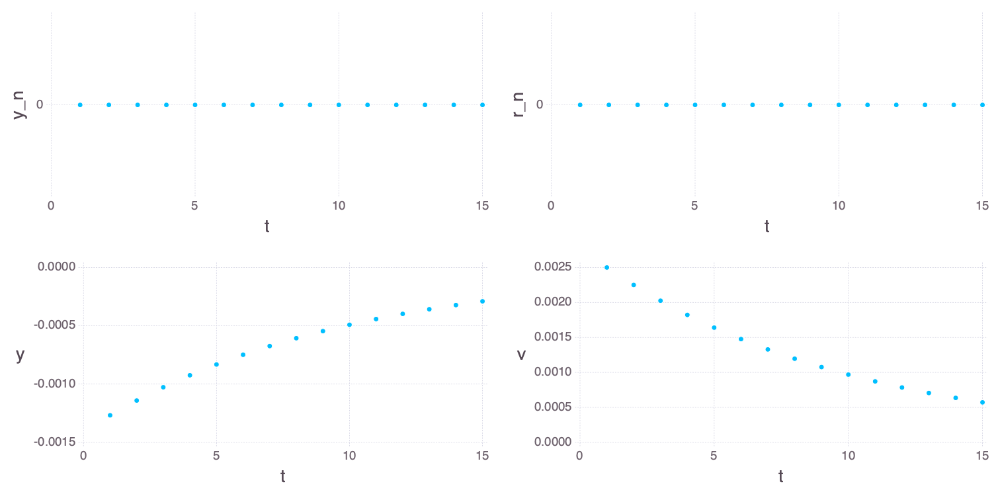

In [9]:
gridstack([plot(df_irf_a,x=:t,y=:y_n) plot(df_irf_a,x=:t,y=:r_n);
           plot(df_irf_a,x=:t,y=:y) plot(df_irf_a,x=:t,y=:ν)])

The effect of the monetary policy shock is also greatly effected by the coefficients of the Taylor rule
if we set the coefficient on inflation to be large enough, then the response of output and inflation
becomes negligable.  Here setting $\phi_\pi=20$ reduces the response of inflation 100 fold.

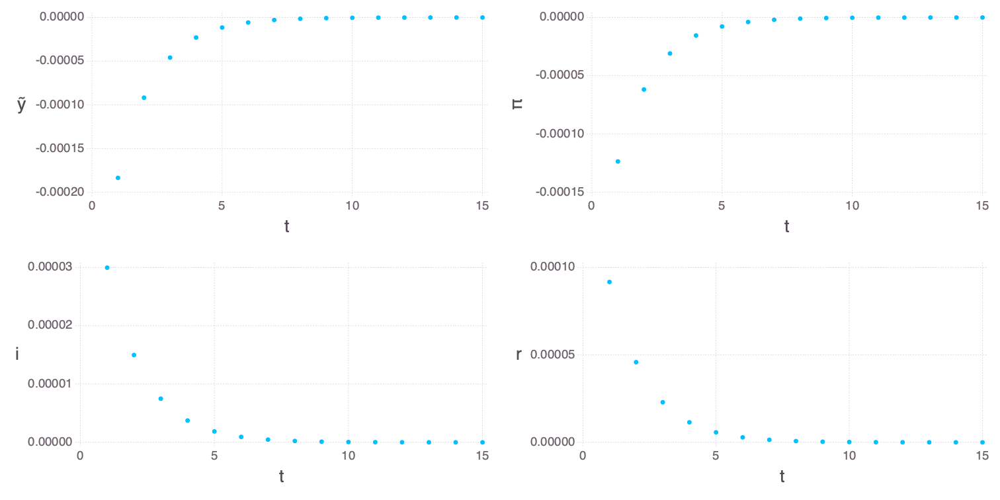

In [10]:
para.ρ_ν = 0.5
para.ϕ_π = 20.
df_irf_a = compute_irf_msv(para,0.,para.σ_ν,15)
gridstack([plot(df_irf_a,x=:t,y=:ỹ) plot(df_irf_a,x=:t,y=:π);
           plot(df_irf_a,x=:t,y=:i) plot(df_irf_a,x=:t,y=:r);])

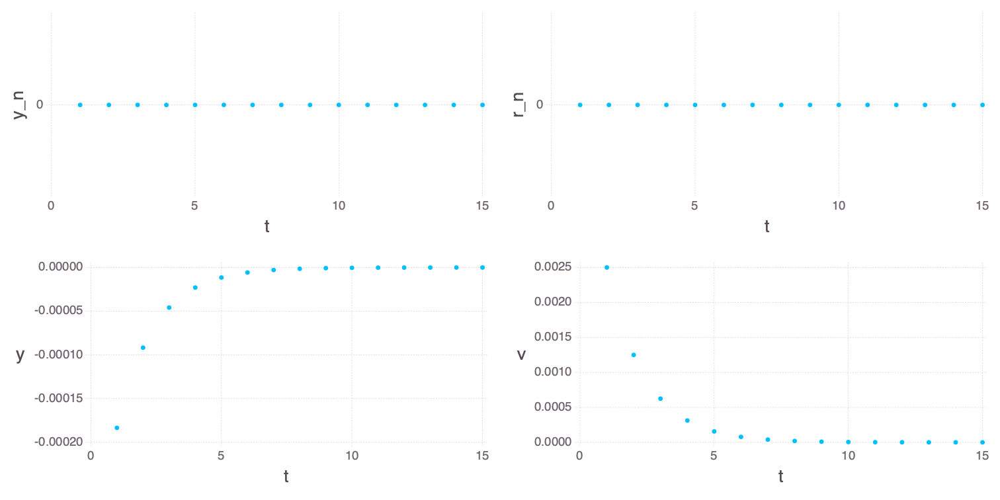

In [11]:
gridstack([plot(df_irf_a,x=:t,y=:y_n) plot(df_irf_a,x=:t,y=:r_n);
           plot(df_irf_a,x=:t,y=:y) plot(df_irf_a,x=:t,y=:ν)])

### TFP Shock
We can also study the response of the economy to a supply side shock.  A 1% decrease in productivity
generates the following paths of endogenous variables

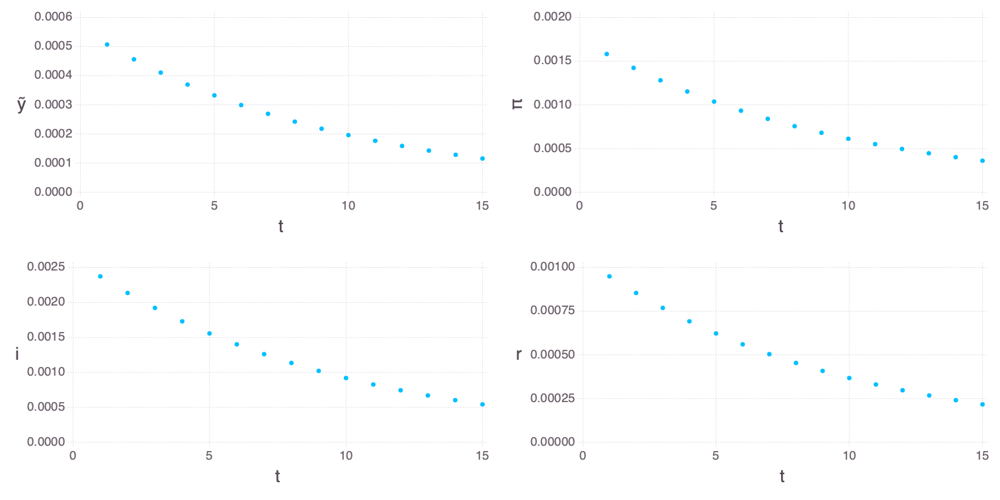

In [12]:
para = NKParameters()
df_irf_a = compute_irf_msv(para,-para.σ_a,0.,15)
gridstack([plot(df_irf_a,x=:t,y=:ỹ) plot(df_irf_a,x=:t,y=:π);
           plot(df_irf_a,x=:t,y=:i) plot(df_irf_a,x=:t,y=:r);])

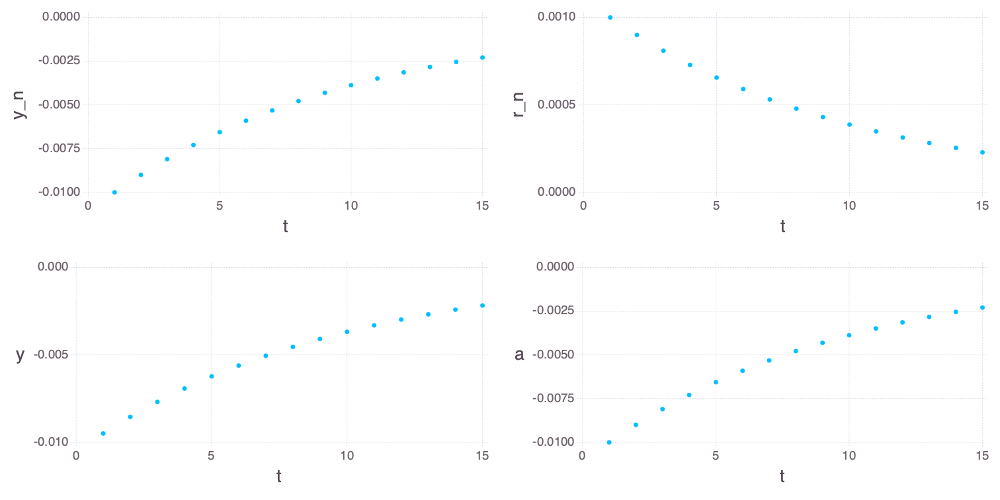

In [13]:
gridstack([plot(df_irf_a,x=:t,y=:y_n) plot(df_irf_a,x=:t,y=:r_n);
           plot(df_irf_a,x=:t,y=:y) plot(df_irf_a,x=:t,y=:a)])

The supply side shock generates "stagflation": a persistent increase in inflation coupled with 
a decline in output (though not as much as would exist in the flexible price economy).  The increase in inflation 
is driven by firms anticipating an increase in marginal costs as a firm's marginal cost is $W_t/A_t$ (lower $A_t$ means 
higher maringal costs).  Higher anticipated marginal costs generates anticipated inflation which leads to higher inflation 
in the current period. The monetary authority has to raise nominal interest rates above the natural rate to keep inflation 
under control.

Inflation expectaions can have a feedback effect.  If we give the monetary authority a Taylor rule
which aggresively targets inflation we see that not only is inflation is both kept at a lower level but the
monetary authority does not have to raise interest rates nearly as much.

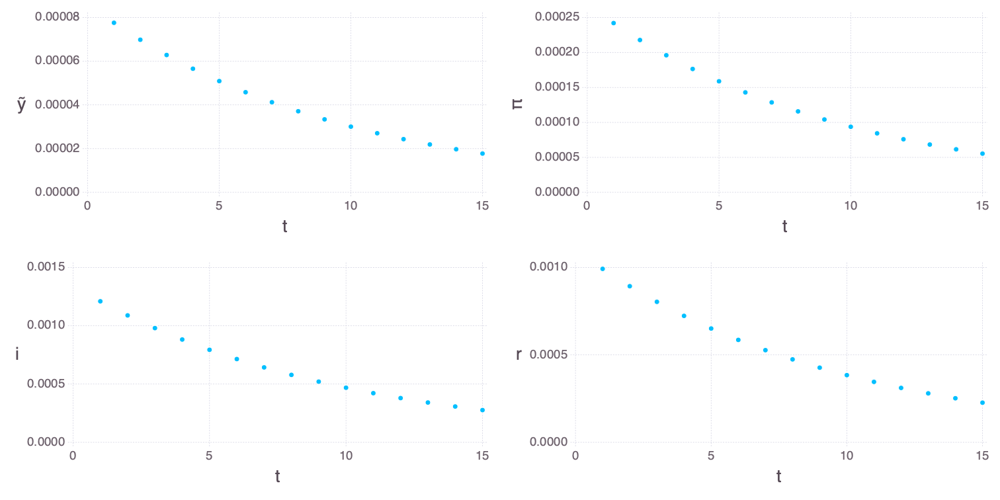

In [14]:
para = NKParameters()
para.ϕ_π = 5.
df_irf_a = compute_irf_msv(para,-para.σ_a,0.,15)
gridstack([plot(df_irf_a,x=:t,y=:ỹ) plot(df_irf_a,x=:t,y=:π);
           plot(df_irf_a,x=:t,y=:i) plot(df_irf_a,x=:t,y=:r);])

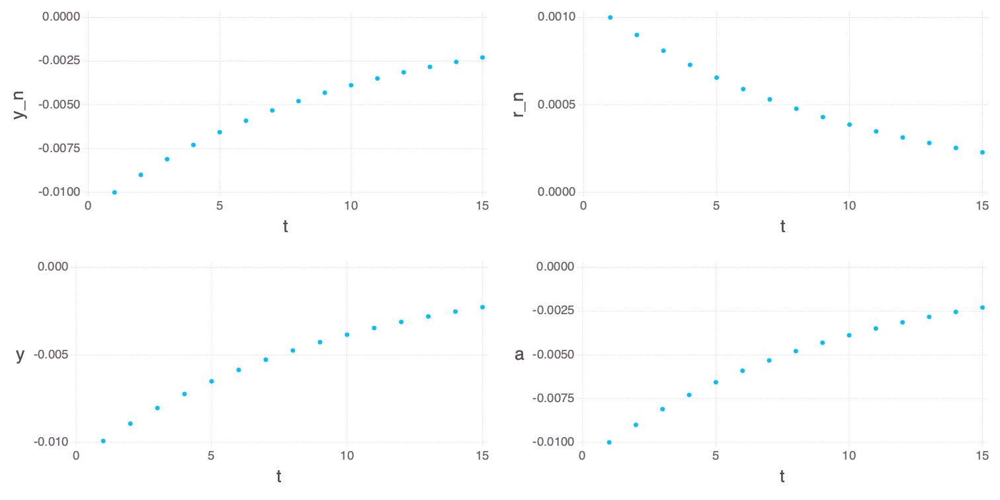

In [15]:
gridstack([plot(df_irf_a,x=:t,y=:y_n) plot(df_irf_a,x=:t,y=:r_n);
           plot(df_irf_a,x=:t,y=:y) plot(df_irf_a,x=:t,y=:a)])

## Multiple Equilibria
The self fulfilling property of inflation can generate multiple equilibria if the monetery authority 
is not aggregsive enough.  To see this let's consider the case where one of the eigenvalues of $A$ (see above) 
is greater than 1.  Let $x_\mu$ be that eigenvector with eigenvalue $\gamma$ so 
$$
    A x_\mu = \gamma x_\mu.
$$
Let $\mu_t$ be an AR(1) process which follows
$$
\mu_t = \frac{1}{\gamma}\mu_{t-1}+\epsilon_{\mu,t}
$$
where $\epsilon_{\mu,t}$ is i.i.d. mean zero.  Our claim is that the process 
$$
x_t = x_a a_t + x_\nu \nu_t + x_\mu \mu_t
$$
satisfies our matrix difference equation.  Note that $|\gamma|>1$ implies that $x_t$ is stationary.

We've already shown that 
$$
x_a a_t + x_\nu \nu_t = A\mathbb E_t\left[x_a a_{t+1} + x_\nu \nu_t{t+1}\right] + B(\hat r^n_t -\nu_t)
$$
so all that remains to check is that 
$$
x_\mu \mu_t = A\mathbb E_t\left[x_\mu\mu_{t+1}\right]
$$
this is verified as
$$
A\mathbb E_t\left[x_\mu\mu_{t+1}\right] = A x_\mu\frac{1}{\gamma}\mu_t =\gamma x_\mu \frac{1}{\gamma}\mu_t = x_\mu \mu_t
$$
These equilibria are called sunspots because they are not tied to fundamentals but are instead generated by spontaneous
coordination of beliefs: suddenly there is inflation because everyone anticipates inflation in the future.

As an example consider the calibration where $\phi_\pi=0$, this is equivalent to the monetary authority instituting an interest 
rate peg and imosing $i_t = \rho$ for all periods.  We can compute the eigenvalues of $A$ under that calibration

In [16]:
para = NKParameters()
para.ϕ_π = 0.
x_a,x_ν,A,B = solve_eqb_msv(para)
print(eigvals(A))

[0.5590090759755555, 1.7709909240244446]

So not only do we have our original MSV equilibrium but there is also a continuum of equilibria with persistence $0.56=1/1.77$ 
corrsponding to the vector

In [17]:
eigvecs(A)[:,2]

2-element Vector{Float64}:
 -0.7919498470798544
 -0.6105861443811145

In this model, it is possible to show that there will be multiple equilibria if the Taylor rule doesn't move more than 1-1
with inflation: when $\phi_\pi < 1$.  We can see that here.  When $\phi_\pi$ is slightly more than 1 there is a unique staitionary equilibria

In [18]:
para.ϕ_π = 1.01
x_a,x_ν,A,B = solve_eqb_msv(para)
print(eigvals(A))

[0.7443032617569623, 0.9901019786777554]

and when $\phi_\pi$ is slightly less than 1 there can be multiple equilibria

In [19]:
para.ϕ_π = 0.99
x_a,x_ν,A,B = solve_eqb_msv(para)
print(eigvals(A))

[0.7336776276716115, 1.0095514610609935]